## Word level sign language

In [0]:
# load packages

import cv2
import json
import os
import time
import urllib.request
import numpy as np
from google.colab.patches import cv2_imshow
from multiprocessing.dummy import Pool

In [0]:
# check basic information of WLASL data
file_path = '/content/drive/My Drive/WLASL/WLASL_v0.1.json'

with open(file_path) as ipf:
    content = json.load(ipf)

cnt_train = 0
cnt_val = 0
cnt_test = 0

for ent in content:
    gloss = ent['gloss']

    for inst in ent['instances']:
        split = inst['split']

        if split == 'train':
            cnt_train += 1
        elif split == 'val':
            cnt_val += 1
        elif split == 'test':
            cnt_test += 1
        else:
            raise ValueError("Invalid split.")

print('total glosses: {}'.format(len(content)))
print('total samples: {}'.format(cnt_train + cnt_val + cnt_test))
print('train count: {}'.format(cnt_train))
print('validation count: {}'.format(cnt_val))
print('test count: {}'.format(cnt_test))


total glosses: 2000
total samples: 21083
train count: 14289
validation count: 3916
test count: 2878


In [0]:
# help function for downloading .mp4 and .swf files
def download_video(json_file_path):

  with open(json_file_path) as ipf:
    content = json.load(ipf)

  for ent in content:
    gloss = ent['gloss']
    train_folder_path = '/content/drive/My Drive/WLASL/data/train/'+str(gloss)
    val_folder_path ='/content/drive/My Drive/WLASL/data/val/'+str(gloss)
    test_folder_path ='/content/drive/My Drive/WLASL/data/test/'+str(gloss)
    os.mkdir(train_folder_path)
    os.mkdir(val_folder_path)
    os.mkdir(test_folder_path)

    try:
      for inst in ent['instances']:
          split = inst['split']
          url = str(inst['url'])
          video_id = inst['video_id']

          if split == 'train' and '.mp4' in url:
            download_others(url, video_id, gloss, split)
          elif split == 'val' and '.mp4' in url:
            download_others(url, video_id, gloss, split)
          elif split == 'test' and '.mp4' in url:
            download_others(url, video_id, gloss, split)
          elif split == 'train' and '.swf' in url:
            download_aslpro(url, video_id, gloss, split)
          elif split == 'val' and '.swf' in url:
            download_aslpro(url, video_id, gloss, split)
          elif split == 'test' and '.swf' in url:
            download_aslpro(url, video_id, gloss, split)
          
    except:
      pass

In [0]:
download_video(file_path)

In [0]:
# display the content of json file
content[0]

{'gloss': 'book',
 'instances': [{'bbox': [385, 37, 885, 720],
   'fps': 25,
   'frame_end': -1,
   'frame_start': 1,
   'instance_id': 0,
   'signer_id': 118,
   'source': 'aslbrick',
   'split': 'train',
   'url': 'http://aslbricks.org/New/ASL-Videos/book.mp4',
   'variation_id': 0,
   'video_id': '69241'},
  {'bbox': [190, 25, 489, 370],
   'fps': 25,
   'frame_end': -1,
   'frame_start': 1,
   'instance_id': 1,
   'signer_id': 90,
   'source': 'aslsignbank',
   'split': 'train',
   'url': 'https://aslsignbank.haskins.yale.edu/dictionary/protected_media/glossvideo/BO/BOOK-418.mp4',
   'variation_id': 0,
   'video_id': '65225'},
  {'bbox': [262, 1, 652, 480],
   'fps': 25,
   'frame_end': -1,
   'frame_start': 1,
   'instance_id': 2,
   'signer_id': 110,
   'source': 'valencia-asl',
   'split': 'train',
   'url': 'https://www.youtube.com/watch?v=0UsjUE-TXns',
   'variation_id': 0,
   'video_id': '68011'},
  {'bbox': [123, 19, 516, 358],
   'fps': 25,
   'frame_end': 60,
   'frame_sta

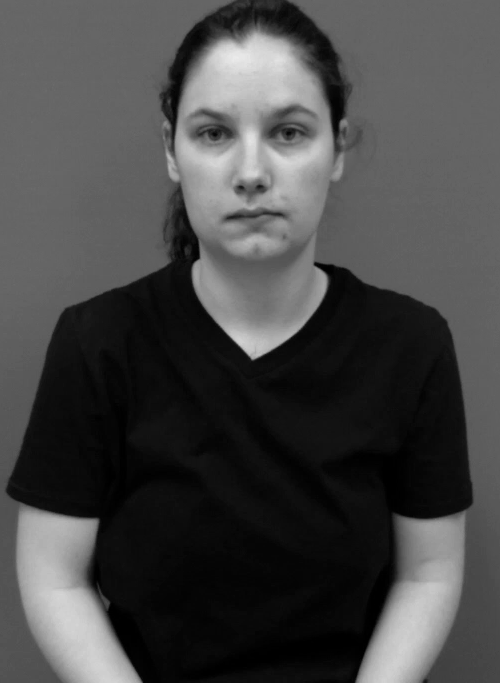

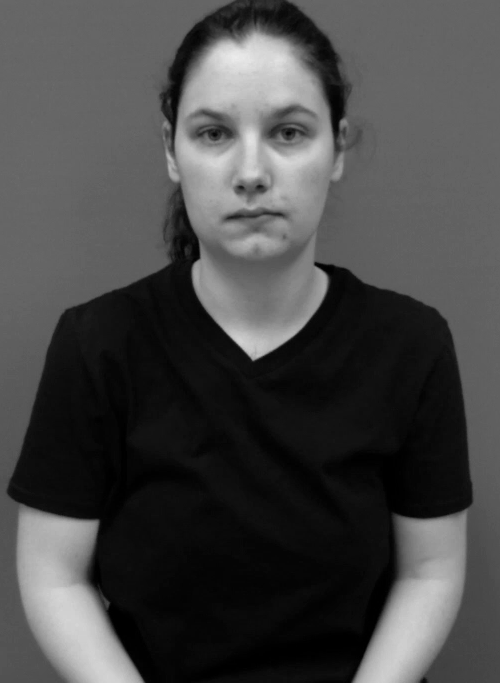

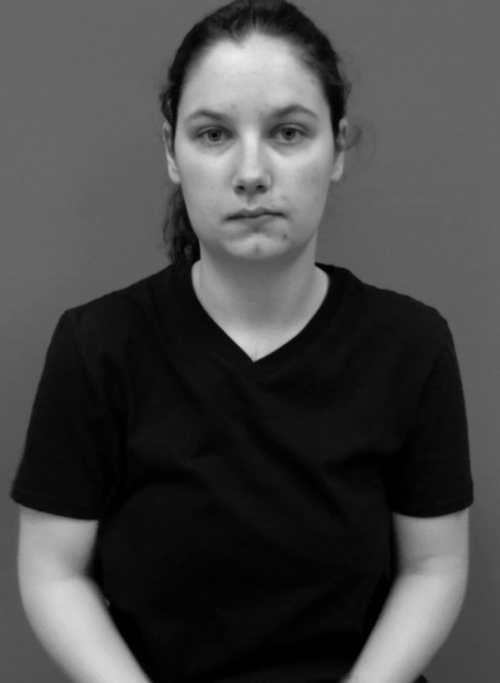

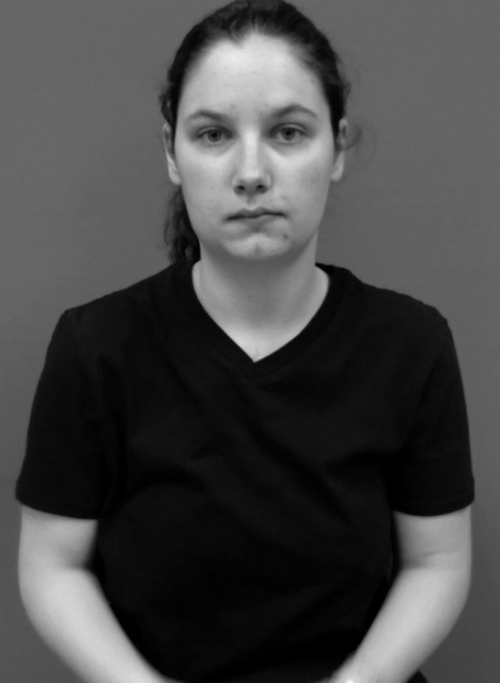

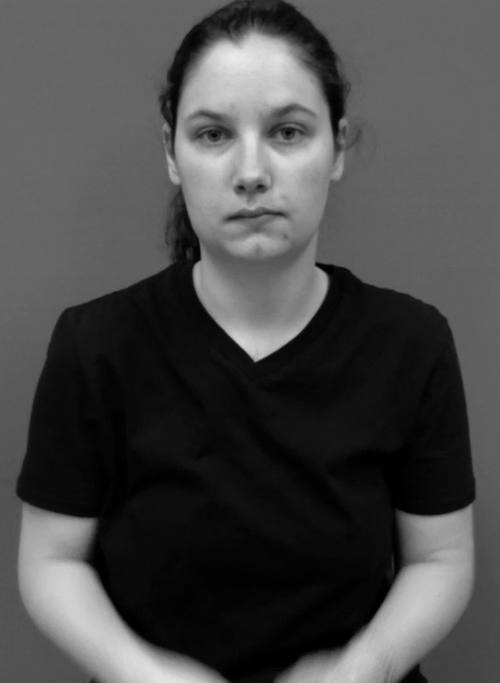

...

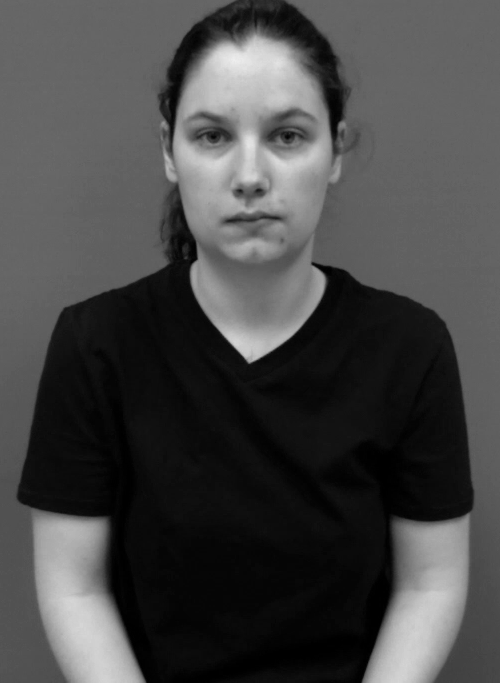

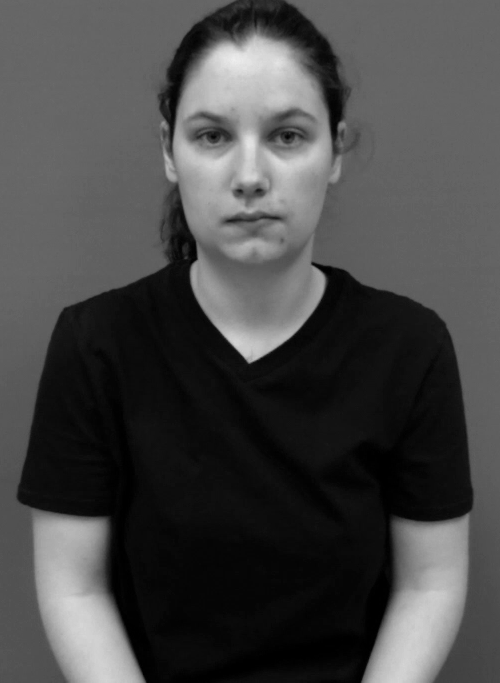

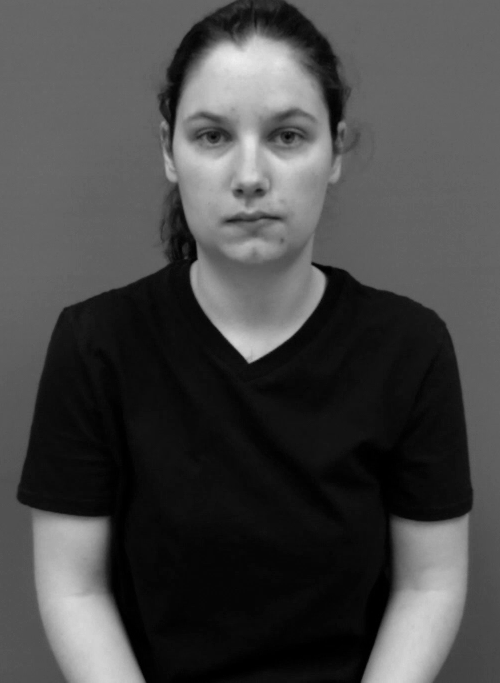

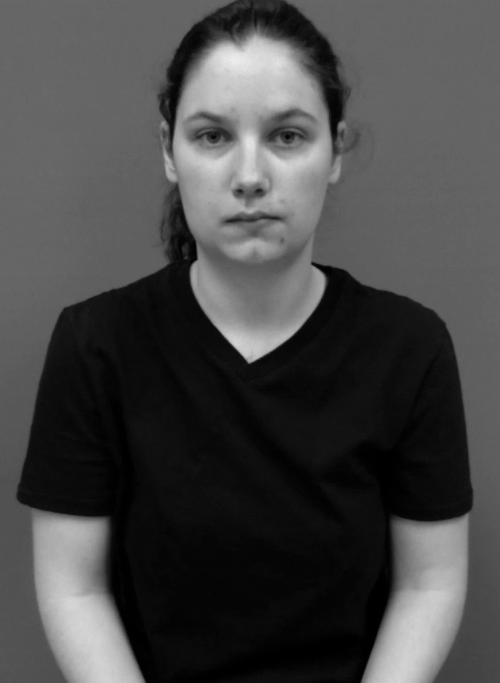

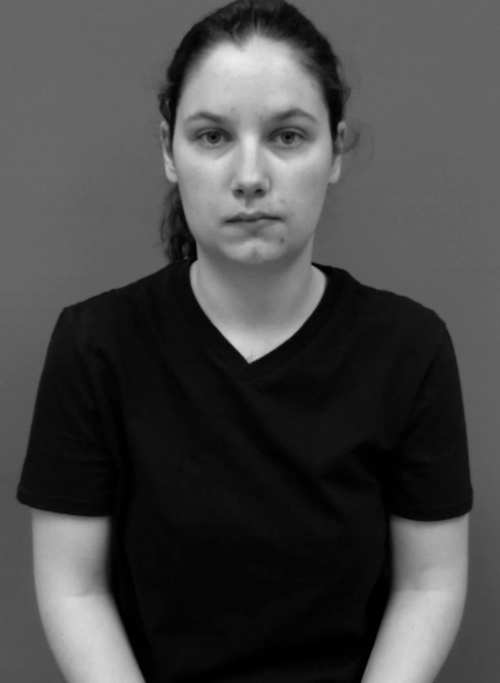

error: ignored

In [0]:
# display of sample video as frame
cap = cv2.VideoCapture('/content/drive/My Drive/WLASL/data/train/book/69241.mp4')

x = 385
y = 37
w = 885-385
h = 720-37

while(cap.isOpened()):
  ret, frame = cap.read()

  gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
  crop_img = gray[y:y+h, x:x+w]

  cv2_imshow(crop_img)
  if cv2.waitKey(1) & 0xFF == ord('q'):
      break

  # cap.release()
  # cv2.destroyAllWindows()